# Flood Classifier

The model that will be created in this notebook can detect whether an area shown in an image is flooded or not. The idea for creating this model has been spurred from the recent floodings in Pakistan.

Such models can prove useful in flood relief, helping to detect which areas need immediate focus.

The dataset used to train this model is **Louisiana flood 2016**, uploaded by Kaggle user **Rahul T P**, which you can view [here](https://www.kaggle.com/datasets/rahultp97/louisiana-flood-2016). 

The fastai library, a high level PyTorch library, has been used.

One of the points of this notebook is to showcase how simple it is to create powerful models. That said, this notebook is **not** a tutorial or guide.

In [1]:
from fastai.vision.all import *

# Sort data.

The data in the dataset needs to be organized into _train_ and _valid_ folders. Each will contain the same subfolders, _0_ and _1_, which will be used to label the data. A label of `0` indicates the area shown in the image is not flooded, while a label of `1` indicates the area shown in the image is flooded.

The images in the dataset itself has been organized as follows:

&nbsp;&nbsp;&nbsp;&nbsp;If no underscore is in the file name, the image shows the area before or after the flood.

&nbsp;&nbsp;&nbsp;&nbsp;If an underscore is in the file name, the image shows the area during the flood:
  * If a zero follows the underscore, the area was not flooded.
  * If a one follows the underscore, the area was flooded.

In [2]:
working_path = Path.cwd(); print(working_path)
folders = ('train', 'valid')
labels = ('0', '1')

/kaggle/working


In [3]:
input_path = Path('')
train_image_paths = sorted(input_path.rglob('train/*.png'))
valid_image_paths = sorted(input_path.rglob('test/*.png'))
len(train_image_paths), len(valid_image_paths)

(270, 52)

In [4]:
for folder in folders:
    if not (working_path/folder).exists():
        (working_path/folder).mkdir()
    for label in labels:
        if not (working_path/folder/label).exists():
            (working_path/folder/label).mkdir()

In [5]:
try:
    for image_path in train_image_paths:
        if '_1' in image_path.stem:
            with (working_path/'train'/'1'/image_path.name).open(mode='xb') as f:
                f.write(image_path.read_bytes())
        else:
            with (working_path/'train'/'0'/image_path.name).open(mode='xb') as f:
                f.write(image_path.read_bytes())
except FileExistsError:
    print("Training images have already been moved.")
else:
    print("Training images moved.")

Training images moved.


In [6]:
try:
    for image_path in valid_image_paths:
        if '_1' in image_path.stem:
            with (working_path/'valid'/'1'/image_path.name).open(mode='xb') as f:
                f.write(image_path.read_bytes())
        else:
            with (working_path/'valid'/'0'/image_path.name).open(mode='xb') as f:
                f.write(image_path.read_bytes())
except FileExistsError:
    print("Testing images have already been moved.")
else:
    print("Testing images moved.")

Testing images moved.


Check that images have been moved.

In [7]:
training_images = get_image_files(working_path/'train'); print(len(training_images))

270


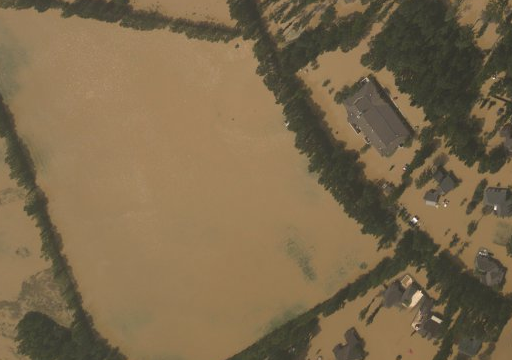

In [8]:
Image.open(training_images[0])

In [9]:
validation_images = get_image_files(working_path/'valid'); print(len(validation_images))

52


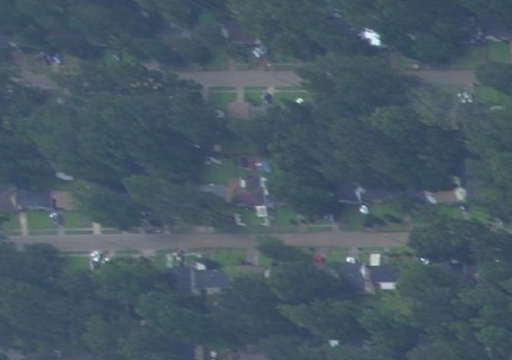

In [10]:
Image.open(validation_images[-1])

# Load data

Create the training and validation dataloaders through fastai's quick and easy `DataBlock` class.

In [11]:
dataloaders = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = GrandparentSplitter(),
    get_y = parent_label,
    item_tfms = [Resize(192, method='squish')]
).dataloaders(working_path, bs=32)

Check that data has been loaded correctly.

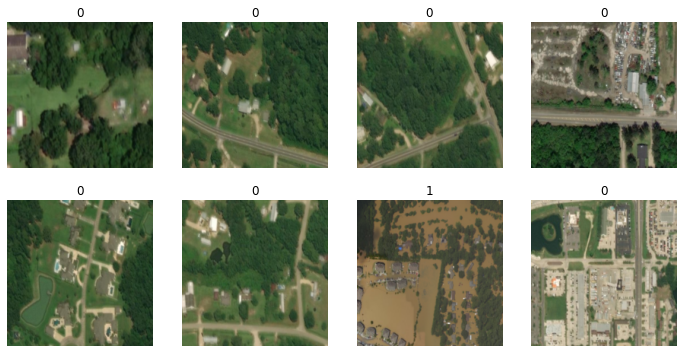

In [12]:
dataloaders.show_batch(max_n=8)

# Instantiate and Train Model

In [13]:
learner = vision_learner(dataloaders, resnet18, metrics=error_rate)
learner.fine_tune(9)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,0.919323,1.118264,0.365385,00:09


epoch,train_loss,valid_loss,error_rate,time
0,0.490039,0.628054,0.250000,00:02
1,0.367996,0.411558,0.192308,00:02
2,0.266664,0.472146,0.192308,00:02
3,0.203069,0.256436,0.115385,00:03
4,0.158453,0.127106,0.076923,00:03
5,0.124499,0.095927,0.038462,00:02
6,0.098409,0.089279,0.038462,00:03
7,0.079600,0.093277,0.038462,00:02
8,0.064886,0.090372,0.038462,00:02


Nice! A relatively low error rate for no tweaking.

# Visualizing Mistakes

We have to see how the model is getting confuzzled.

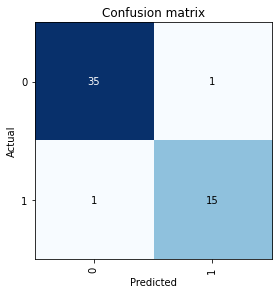

In [14]:
interp = ClassificationInterpretation.from_learner(learner)
interp.plot_confusion_matrix()

Only a couple of mistakes. Let's see what they are.

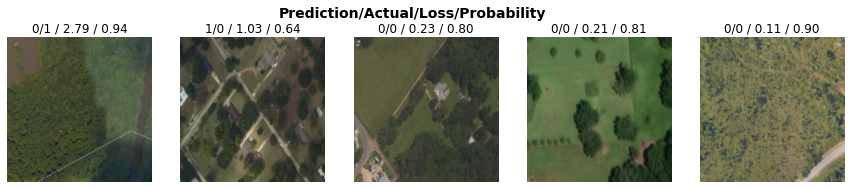

In [15]:
interp.plot_top_losses(5, nrows=1)

Nothing has been mislabeled, but the first one is especially tricky to determine, even for human eyes.

# Model Inference

Let's test the model on some images of the recent flooding in Pakistan.

In [16]:
def infer_image(image_path):
    display(Image.open(image_path))
    label, _, probabilities = learner.predict(PILImage(PILImage.create(image_path)))
    if label == '0':
        print(f"The area shown in the image is not flooded with probability {probabilities[0]*100:.2f}%.")
    elif label == '1':
        print(f"The area shown in the image is flooded with probability {probabilities[1]*100:.2f}%.")
    else:
        print("Unknown label assigned to image.")

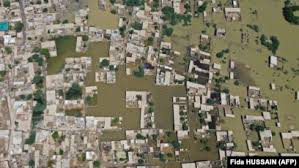

The area shown in the image is not flooded with probability 65.65%.


In [17]:
infer_image(input_path/'floodclassifiertestset'/'1'/'1.jpeg')

Not bad!

Let's try it on another image.

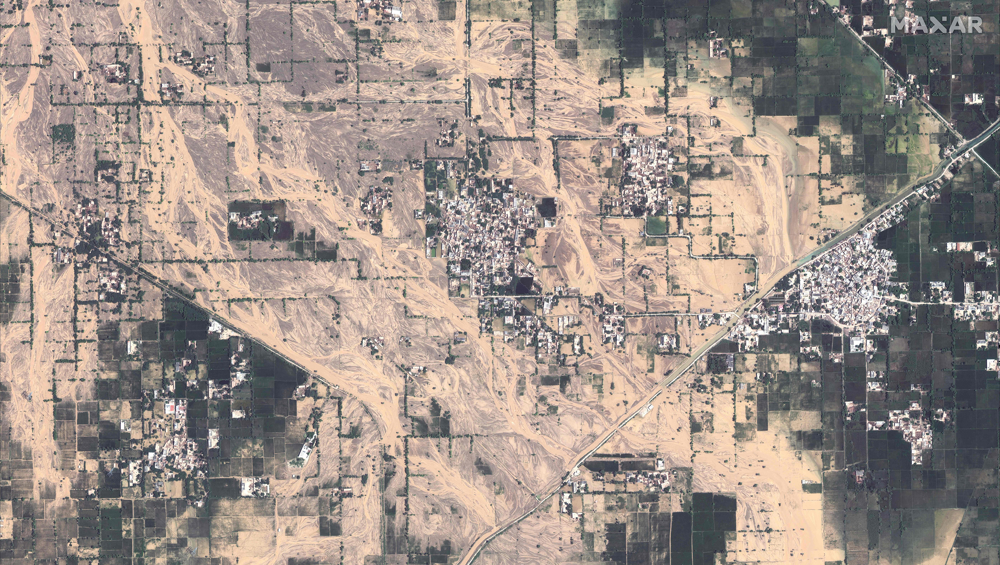

The area shown in the image is flooded with probability 99.90%.


In [18]:
infer_image(input_path/'floodclassifiertestset'/'1'/'2.jpg')

The label for this image is kind of meaningless. This is an image of a vast area of land, so certain areas could be flooded, while others are not. That said, it could be used to determine whether there is flooding in the image. 

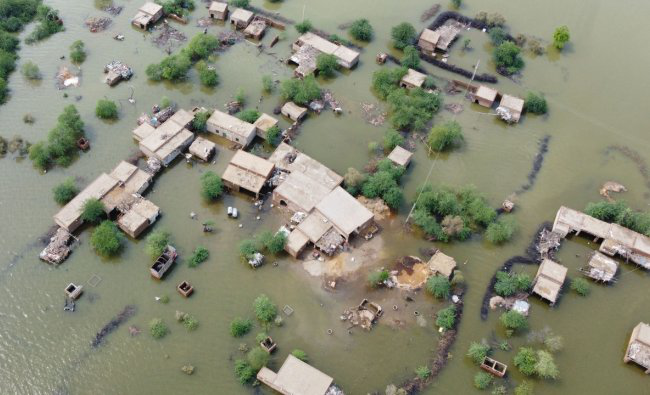

The area shown in the image is flooded with probability 99.99%.


In [19]:
infer_image(input_path/'floodclassifiertestset'/'1'/'3.jpg')

The model performed really well in this case: the input image is shown at a different angle. The images in the training set only show areas from a top-down view.

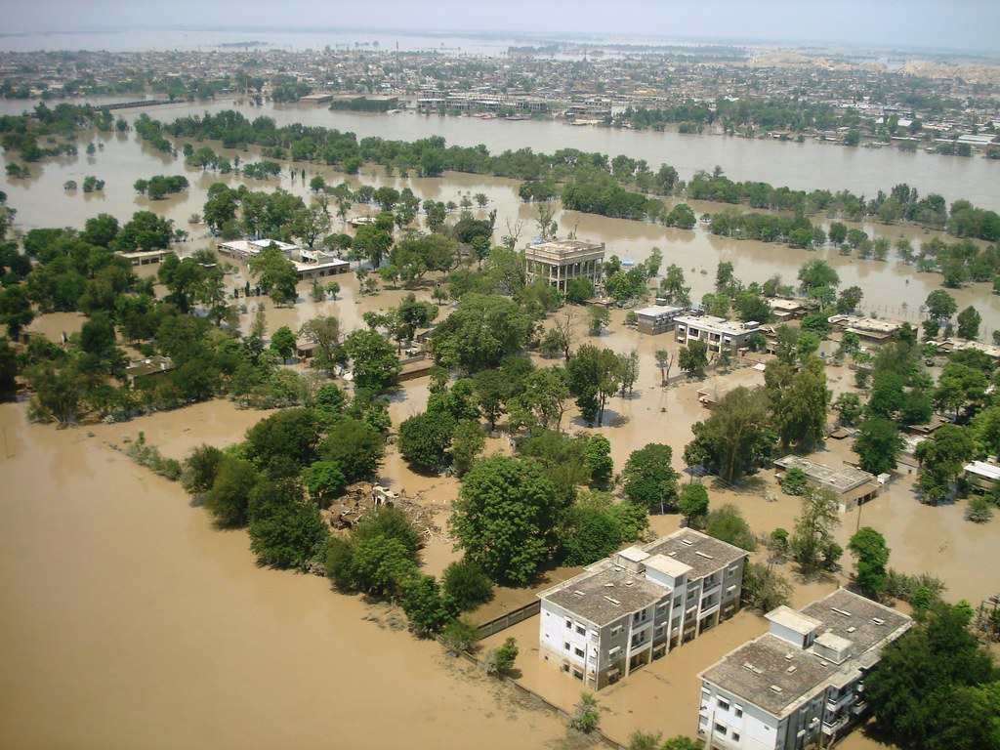

The area shown in the image is not flooded with probability 64.56%.


In [20]:
infer_image(input_path/'floodclassifiertestset'/'1'/'4.jpg')

Over here, the limitations of the current state of the model can be seen. The model is not performing well on images where the view is more parallel to the ground, since the images in the training set are all top-down.

Let's do two more images.

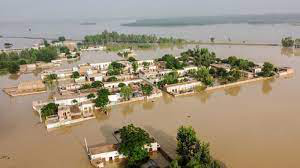

The area shown in the image is flooded with probability 99.94%.


In [21]:
infer_image(input_path/'floodclassifiertestset'/'1'/'5.jpg')

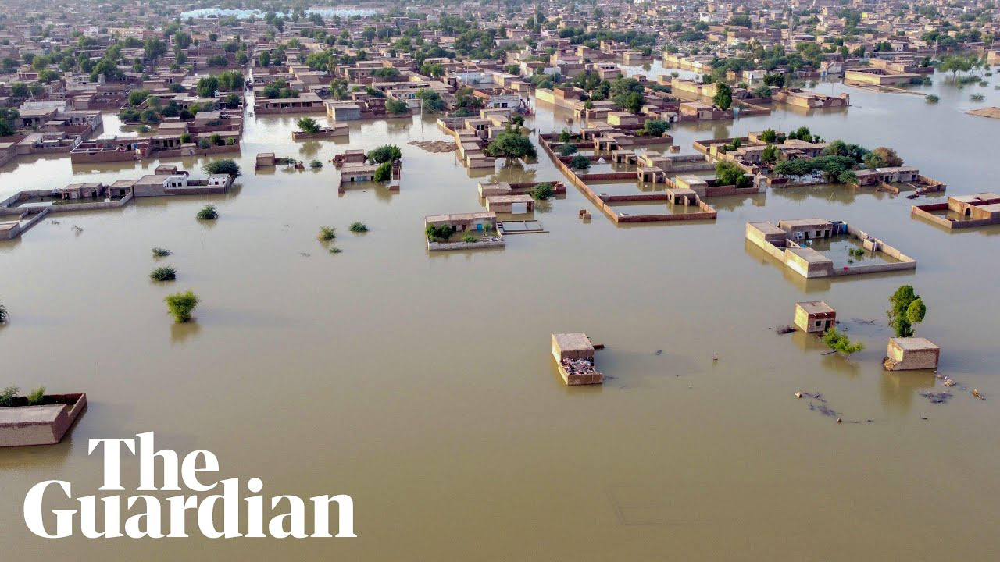

The area shown in the image is flooded with probability 100.00%.


In [22]:
infer_image(input_path/'floodclassifiertestset'/'1'/'6.jpg')

The model is working well with images of different sizes too, and has given this image a very high, correct confidence.

# Improving the model.

Let's see if we can get the model's performance to improve on the image the following image through augmenting the training set.

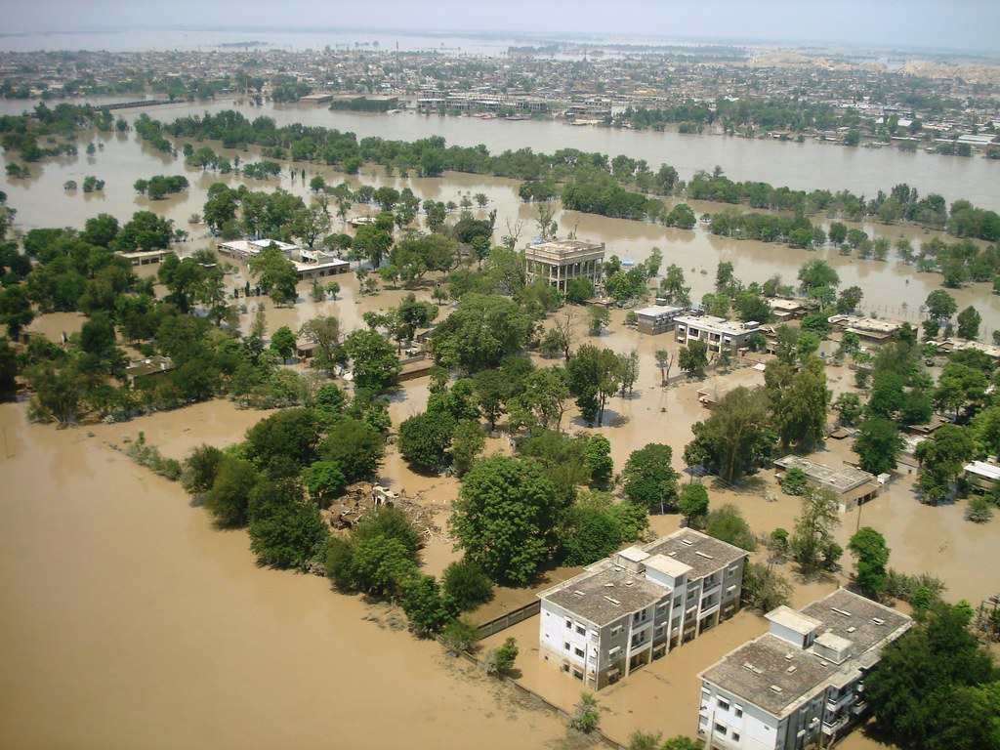

In [23]:
Image.open(input_path/'floodclassifiertestset'/'1'/'4.jpg')

In [24]:
augmented_dataloaders = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = GrandparentSplitter(),
    get_y = parent_label,
    item_tfms = RandomResizedCrop(192, min_scale=0.5),
    batch_tfms=aug_transforms()
).dataloaders(working_path, bs=32)

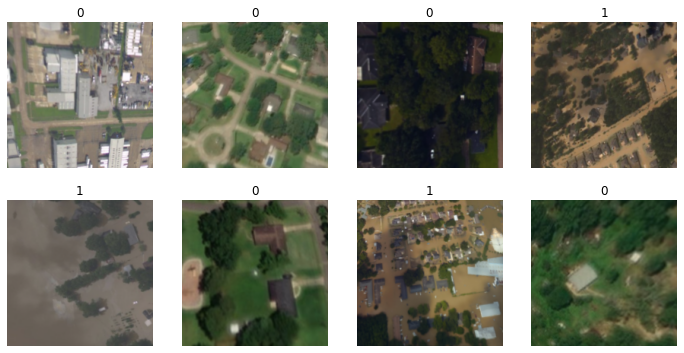

In [25]:
augmented_dataloaders.show_batch(max_n=8)

In [26]:
augmented_learner = vision_learner(augmented_dataloaders, resnet18, metrics=error_rate)
augmented_learner.fine_tune(9)

epoch,train_loss,valid_loss,error_rate,time
0,1.161182,0.835870,0.365385,00:02


epoch,train_loss,valid_loss,error_rate,time
0,0.442552,0.686252,0.288462,00:03
1,0.417739,0.411907,0.153846,00:02
2,0.346400,0.316388,0.057692,00:03
3,0.306782,0.213407,0.076923,00:02
4,0.251947,0.199586,0.076923,00:02
5,0.209951,0.141818,0.057692,00:02
6,0.188433,0.116713,0.057692,00:03
7,0.169689,0.125078,0.057692,00:02
8,0.151843,0.131188,0.057692,00:02


Let's try the new model out.

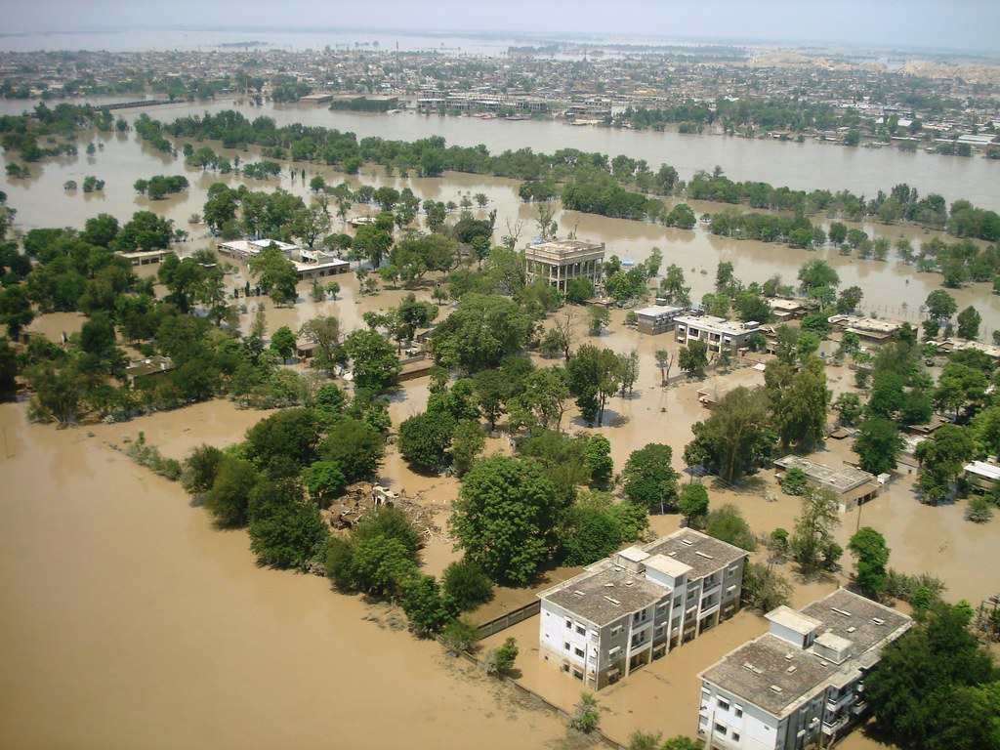

The area shown in the image is flooded with probability 99.91%.


In [27]:
display(Image.open(input_path/'floodclassifiertestset'/'1'/'4.jpg'))
label, _, probabilities = augmented_learner.predict(PILImage(PILImage.create(input_path/'floodclassifiertestset'/'1'/'4.jpg')))
if label == '0':
    print(f"The area shown in the image is not flooded with probability {probabilities[0]*100:.2f}%.")
elif label == '1':
    print(f"The area shown in the image is flooded with probability {probabilities[1]*100:.2f}%.")
else:
    print("Unknown label assigned to image.")

Dang, impressive! The correct label _and_ with excellent confidence!

Before we get too excited though, we should check the performance on the model with the previous images.

In [28]:
test_dataloader = learner.dls.test_dl([image_path for image_path in sorted((input_path/'floodclassifiertestset').rglob('*.*'))])

In [29]:
probabilities, _, labels = augmented_learner.get_preds(dl=test_dataloader, with_decoded=True)

Images are numbered horizontally.
Image 1 is flooded with a probability of 95.94%.
Image 2 is flooded with a probability of 99.92%.
Image 3 is flooded with a probability of 91.34%.
Image 4 is flooded with a probability of 99.71%.
Image 5 is flooded with a probability of 100.00%.
Image 6 is flooded with a probability of 100.00%.


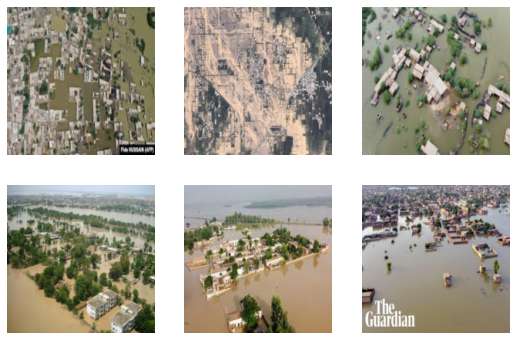

In [30]:
print("Images are numbered horizontally.")
test_dataloader.show_batch()
for probability, label, image_number in zip(probabilities, labels, range(1, 7)):
    if label == 1:
        print(f"Image {image_number} is flooded with a probability of {probability[1]*100:.2f}%.")
    elif label == 0:
        print(f"Image {image_number} is not flooded with a probability of {probability[0]*100:.2f}%.")
    else:
        print(f"Image {image_number} has been assigned an unknown label.")

Drastically improved probabilities! A little augmentation can go a long way.

# Takeaways

This model was trained on only 270 images and minimal code. Accessbility and abstraction to the field of machine learning has come a long, long way. Given the right data and the right pretrained model, a powerful model can be produced in less than an hour, if not half.

This is important: in disasters such as floods, the time taken to produce the logistics required for relief can be drastically reduced. It is also important because the barrier of entry to this field is dramatically lowered; more people can create powerful models, in turn producing better solutions.

However, there could be some improvements and additions made to the model:
* Include a third class to the model. Images that are not flooded, but show signs of having been flooded would be assigned this class. The dataset used for this model includes such images.
* Train the model on images that include a variety of geographic locations and dwellings. The current dataset only contains images taken in a lush, green area with plenty of trees; infrastructure looks a certain way; the color of the floodwater is also dependent on the surroundings. All this makes the model good a prediciting whether an image is flooded for images with certain features.

If you have any comments, suggestions, feedback, criticism, or improvements, please do post them down in the comment section below!.